In [5]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
import numpy as np
import os
import glob
from IPython.display import HTML
import textwrap

In [15]:
def find_episode_directory(base_dir, episode_number):
    """Find the data directory for the specified episode number."""
    pattern = os.path.join(base_dir, f"*_episode_{episode_number}")
    matching_dirs = glob.glob(pattern)
    if not matching_dirs:
        raise FileNotFoundError(f"No data directory found for episode {episode_number} in {base_dir}")
    return matching_dirs[0]

def load_data(data_dir):
    """Load instruction, actions, RGB images, and depth maps from the data directory."""
    with open(os.path.join(data_dir, 'instructions.txt'), 'r') as f:
        instruction = f.readline().strip()
    
    with open(os.path.join(data_dir, 'actions.txt'), 'r') as f:
        actions = [line.strip() for line in f]
    
    rgb_files = sorted(
        glob.glob(os.path.join(data_dir, 'rgbs', 'rgb_*.png')),
        key=lambda x: int(x.split('_')[-1].split('.')[0])
    )
    rgbs = [np.array(Image.open(file)) for file in rgb_files]
    
    depth_files = sorted(
        glob.glob(os.path.join(data_dir, 'depths', 'depth_*.npy')),
        key=lambda x: int(x.split('_')[-1].split('.')[0])
    )
    depths = [np.load(file) for file in depth_files]
    
    assert len(rgbs) == len(depths) == len(actions), \
        f"Mismatch in data lengths: RGBs ({len(rgbs)}), Depths ({len(depths)}), Actions ({len(actions)})"
    
    return instruction, actions, rgbs, depths

base_dir = 'training_data'
episode_number = 990

data_dir = find_episode_directory(base_dir, episode_number)

instruction, actions, rgbs, depths = load_data(data_dir)
print(instruction)
print(len(actions))
print(len(rgbs))
print(len(depths))

Go past the kitchen island and turn left.  Go through the kitchen and stop when the antique scale is on the left.
45
45
45


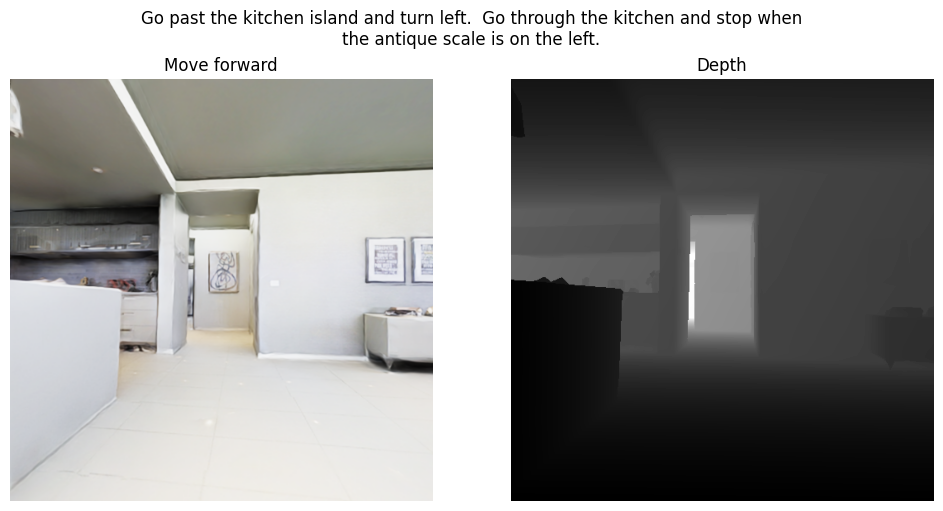

In [16]:
wrapped_instruction = '\n'.join(textwrap.wrap(instruction, width=80))
fig, (ax_rgb, ax_depth) = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)
fig.suptitle(wrapped_instruction)

im_rgb = ax_rgb.imshow(rgbs[0])
ax_rgb.set_title(actions[0])
ax_rgb.axis('off')

im_depth = ax_depth.imshow(depths[0], cmap='gray')
ax_depth.set_title("Depth")
ax_depth.axis('off')

def update(frame):
    im_rgb.set_data(rgbs[frame])
    im_depth.set_data(depths[frame])
    ax_rgb.set_title(actions[frame])
    return im_rgb, im_depth, ax_rgb.title

In [17]:
ani = animation.FuncAnimation(fig, update, frames=len(rgbs), interval=500, blit=True)
HTML(ani.to_jshtml())